In [ ]:
import os
import random
import torch
import numpy as np
from torchvision import models
from torchsummary import summary
from torch import nn, optim
from torch.optim import lr_scheduler

from data_loading import Data, default_imagenet_train_transform, default_imagenet_valid_transform, default_imagenet_test_transform
from model_training import train_model, plot_training_history
from model_testing import test_model, plot_examples
from cifar_extracting import extract_cifar

In [ ]:
random_seed = 24 # 42, 62
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [308]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [309]:
cinic_directory = 'C:/Users/weron/Pulpit/sem1/dl/proj1/archive'
data_dir = 'C:/Users/weron/Pulpit/sem1/dl/proj1/cifar'

#extract_cifar(cinic_directory, data_dir)

data = Data(
    data_dir, 
    train_transform = default_imagenet_train_transform(), 
    valid_transform = default_imagenet_valid_transform(), 
    test_transform = default_imagenet_test_transform()
)

# EfficientNetB0


In [310]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [311]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [312]:
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 16, 16]             864
       BatchNorm2d-2           [-1, 32, 16, 16]              64
              SiLU-3           [-1, 32, 16, 16]               0
            Conv2d-4           [-1, 32, 16, 16]             288
       BatchNorm2d-5           [-1, 32, 16, 16]              64
              SiLU-6           [-1, 32, 16, 16]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12           [-1, 32, 16, 16]               0
           Conv2d-13           [-1, 16, 16, 16]             512
      BatchNorm2d-14           [-1, 16,

In [313]:
sample_input = torch.randn(1, 3, 32, 32).to(device)
model.eval()
with torch.no_grad():
    output = model(sample_input)
print(output.shape)

torch.Size([1, 10])


In [314]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.5031 Acc: 0.5158
valid Loss: 0.5911 Acc: 0.8175

Epoch 1/19
----------
train Loss: 0.8990 Acc: 0.6898
valid Loss: 0.3556 Acc: 0.8839

Epoch 2/19
----------
train Loss: 0.7503 Acc: 0.7431
valid Loss: 0.2809 Acc: 0.9074

Epoch 3/19
----------
train Loss: 0.6824 Acc: 0.7678
valid Loss: 0.2407 Acc: 0.9192

Epoch 4/19
----------
train Loss: 0.6324 Acc: 0.7814
valid Loss: 0.2135 Acc: 0.9283

Epoch 5/19
----------
train Loss: 0.5838 Acc: 0.7993
valid Loss: 0.1983 Acc: 0.9335

Epoch 6/19
----------
train Loss: 0.5676 Acc: 0.8047
valid Loss: 0.1842 Acc: 0.9393

Epoch 7/19
----------
train Loss: 0.5293 Acc: 0.8183
valid Loss: 0.1785 Acc: 0.9412

Epoch 8/19
----------
train Loss: 0.5205 Acc: 0.8212
valid Loss: 0.1718 Acc: 0.9424

Epoch 9/19
----------
train Loss: 0.5196 Acc: 0.8231
valid Loss: 0.1775 Acc: 0.9399

Epoch 10/19
----------
train Loss: 0.5087 Acc: 0.8256
valid Loss: 0.1723 Acc: 0.9428

Epoch 11/19
----------
train Loss: 0.5092 Acc: 0.8264
valid Loss

In [315]:
title = 'Cifar_EfficientNetB0_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

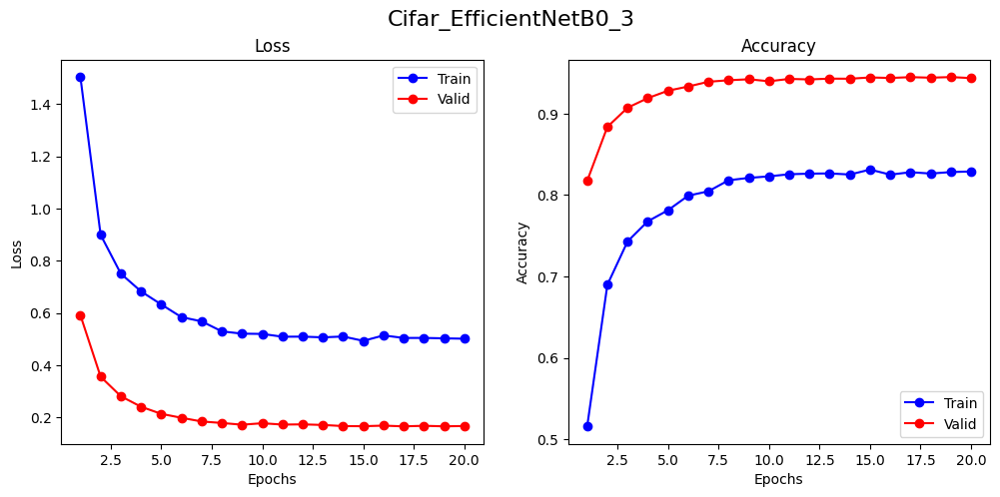

In [316]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [317]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9441

Classification Report:
              precision    recall  f1-score   support

    airplane       0.94      0.95      0.95      2000
  automobile       0.97      0.97      0.97      2000
        bird       0.96      0.92      0.94      2000
         cat       0.90      0.88      0.89      2000
        deer       0.93      0.95      0.94      2000
         dog       0.91      0.92      0.91      2000
        frog       0.95      0.98      0.96      2000
       horse       0.96      0.95      0.95      2000
        ship       0.97      0.97      0.97      2000
       truck       0.96      0.96      0.96      2000

    accuracy                           0.94     20000
   macro avg       0.94      0.94      0.94     20000
weighted avg       0.94      0.94      0.94     20000



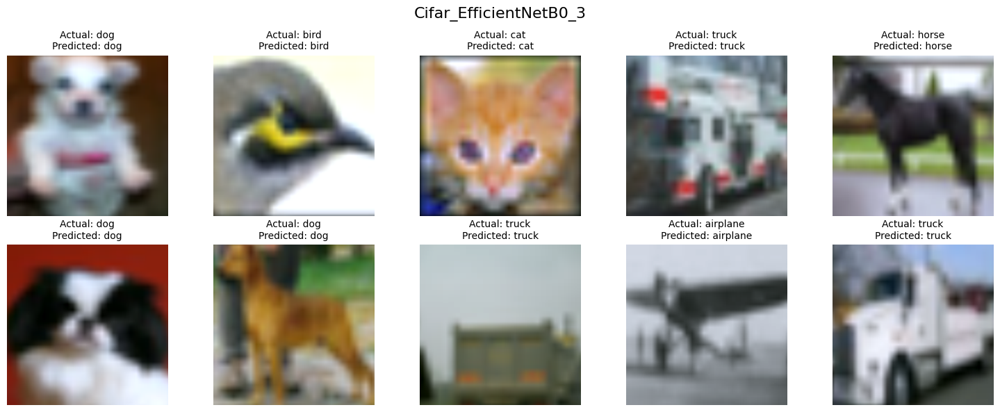

In [318]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

## Adam


### EfficientNetB0 Adam


In [319]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [320]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [321]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.0424 Acc: 0.6416
valid Loss: 0.4373 Acc: 0.8513

Epoch 1/19
----------
train Loss: 0.8156 Acc: 0.7198
valid Loss: 0.4033 Acc: 0.8620

Epoch 2/19
----------
train Loss: 0.7369 Acc: 0.7477
valid Loss: 0.3283 Acc: 0.8897

Epoch 3/19
----------
train Loss: 0.6679 Acc: 0.7676
valid Loss: 0.3298 Acc: 0.8825

Epoch 4/19
----------
train Loss: 0.6509 Acc: 0.7754
valid Loss: 0.3020 Acc: 0.8953

Epoch 5/19
----------
train Loss: 0.6093 Acc: 0.7918
valid Loss: 0.2907 Acc: 0.9020

Epoch 6/19
----------
train Loss: 0.5974 Acc: 0.7950
valid Loss: 0.2809 Acc: 0.9061

Epoch 7/19
----------
train Loss: 0.4725 Acc: 0.8362
valid Loss: 0.1880 Acc: 0.9365

Epoch 8/19
----------
train Loss: 0.4170 Acc: 0.8568
valid Loss: 0.1757 Acc: 0.9381

Epoch 9/19
----------
train Loss: 0.3950 Acc: 0.8647
valid Loss: 0.1656 Acc: 0.9432

Epoch 10/19
----------
train Loss: 0.3799 Acc: 0.8683
valid Loss: 0.1617 Acc: 0.9444

Epoch 11/19
----------
train Loss: 0.3636 Acc: 0.8748
valid Loss

In [322]:
title = 'Cifar_EfficientNetB0_Adam_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

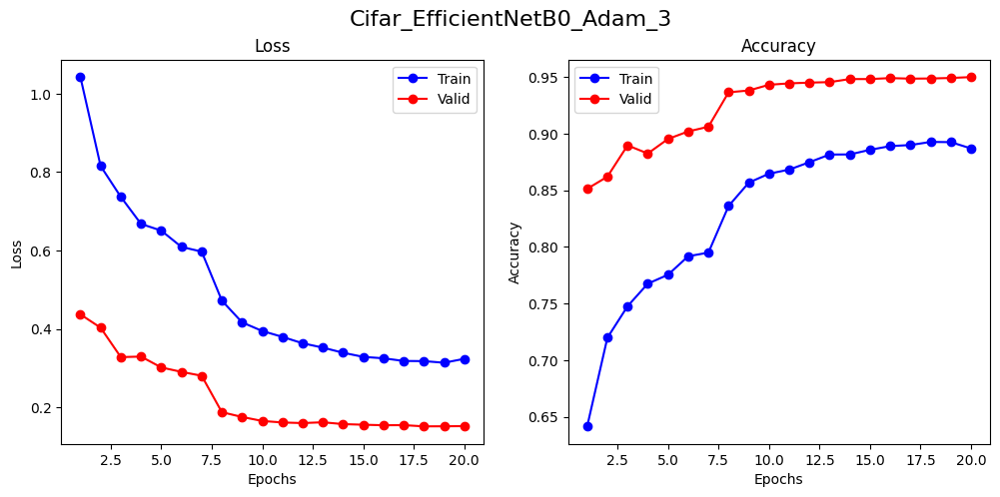

In [323]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [324]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9474

Classification Report:
              precision    recall  f1-score   support

    airplane       0.95      0.95      0.95      2000
  automobile       0.97      0.97      0.97      2000
        bird       0.93      0.94      0.93      2000
         cat       0.90      0.87      0.88      2000
        deer       0.95      0.95      0.95      2000
         dog       0.91      0.91      0.91      2000
        frog       0.95      0.98      0.96      2000
       horse       0.97      0.96      0.97      2000
        ship       0.97      0.97      0.97      2000
       truck       0.96      0.97      0.97      2000

    accuracy                           0.95     20000
   macro avg       0.95      0.95      0.95     20000
weighted avg       0.95      0.95      0.95     20000



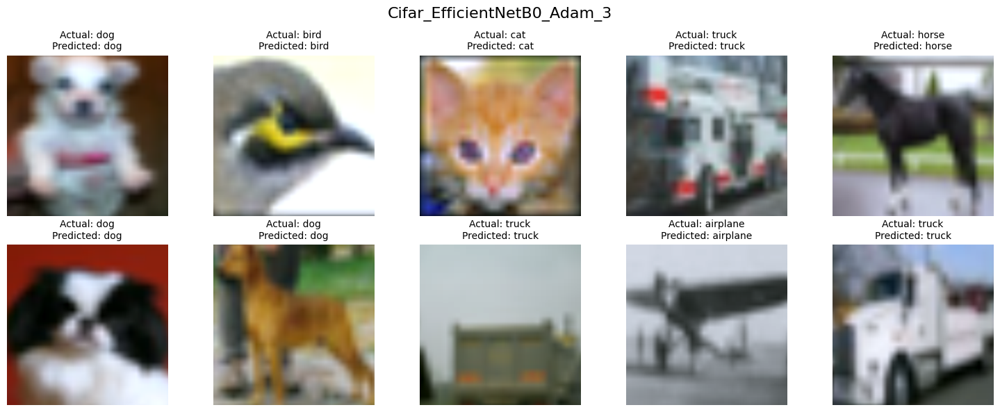

In [325]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 ADAM wd = 0.001


In [326]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [327]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [328]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.1054 Acc: 0.6178
valid Loss: 0.6592 Acc: 0.7801

Epoch 1/19
----------
train Loss: 1.0038 Acc: 0.6550
valid Loss: 0.6590 Acc: 0.7797

Epoch 2/19
----------
train Loss: 1.0133 Acc: 0.6470
valid Loss: 0.6613 Acc: 0.7783

Epoch 3/19
----------
train Loss: 0.9967 Acc: 0.6502
valid Loss: 0.6662 Acc: 0.7714

Epoch 4/19
----------
train Loss: 1.0030 Acc: 0.6501
valid Loss: 0.6906 Acc: 0.7605

Epoch 5/19
----------
train Loss: 0.9893 Acc: 0.6585
valid Loss: 0.6286 Acc: 0.7830

Epoch 6/19
----------
train Loss: 0.9670 Acc: 0.6664
valid Loss: 0.6285 Acc: 0.7843

Epoch 7/19
----------
train Loss: 0.7998 Acc: 0.7269
valid Loss: 0.4204 Acc: 0.8591

Epoch 8/19
----------
train Loss: 0.7383 Acc: 0.7461
valid Loss: 0.3999 Acc: 0.8660

Epoch 9/19
----------
train Loss: 0.7159 Acc: 0.7521
valid Loss: 0.3851 Acc: 0.8705

Epoch 10/19
----------
train Loss: 0.7040 Acc: 0.7608
valid Loss: 0.3749 Acc: 0.8731

Epoch 11/19
----------
train Loss: 0.6891 Acc: 0.7630
valid Loss

In [329]:
title = 'Cifar_EfficientNetB0_Adam_WG0001_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

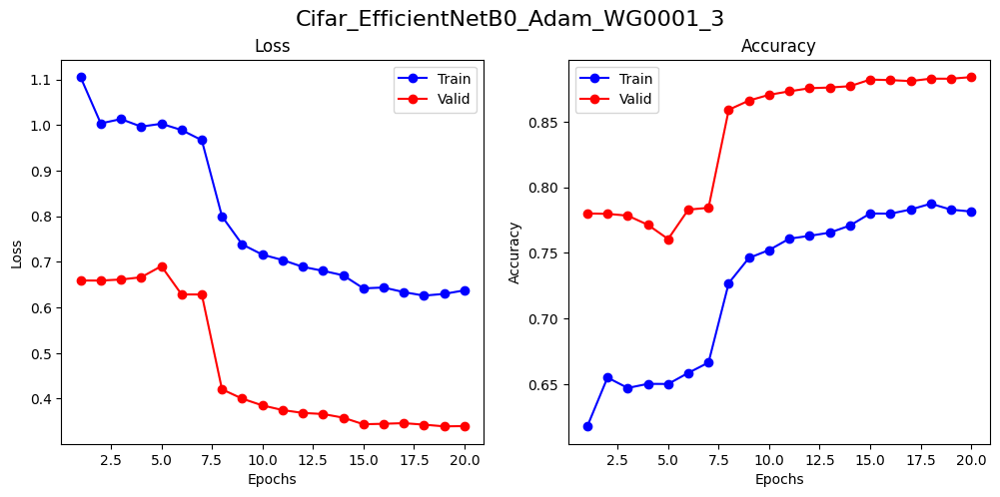

In [330]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [331]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.8884

Classification Report:
              precision    recall  f1-score   support

    airplane       0.88      0.90      0.89      2000
  automobile       0.94      0.96      0.95      2000
        bird       0.86      0.85      0.85      2000
         cat       0.79      0.78      0.79      2000
        deer       0.89      0.89      0.89      2000
         dog       0.83      0.82      0.82      2000
        frog       0.89      0.94      0.91      2000
       horse       0.92      0.90      0.91      2000
        ship       0.95      0.92      0.93      2000
       truck       0.93      0.94      0.93      2000

    accuracy                           0.89     20000
   macro avg       0.89      0.89      0.89     20000
weighted avg       0.89      0.89      0.89     20000



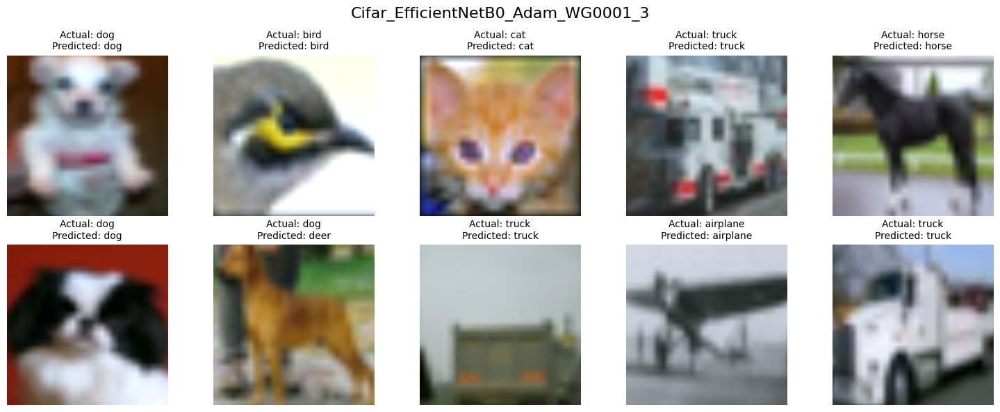

In [332]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 ADAM wd = 0.01


In [333]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [334]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [335]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.4499 Acc: 0.4933
valid Loss: 1.3955 Acc: 0.4908

Epoch 1/19
----------
train Loss: 1.5354 Acc: 0.4473
valid Loss: 1.4205 Acc: 0.4904

Epoch 2/19
----------
train Loss: 1.5227 Acc: 0.4526
valid Loss: 1.7068 Acc: 0.3582

Epoch 3/19
----------
train Loss: 1.4947 Acc: 0.4605
valid Loss: 1.4547 Acc: 0.4715

Epoch 4/19
----------
train Loss: 1.4920 Acc: 0.4633
valid Loss: 1.7497 Acc: 0.3967

Epoch 5/19
----------
train Loss: 1.4855 Acc: 0.4675
valid Loss: 1.3090 Acc: 0.5371

Epoch 6/19
----------
train Loss: 1.4892 Acc: 0.4683
valid Loss: 1.3020 Acc: 0.5338

Epoch 7/19
----------
train Loss: 1.3731 Acc: 0.5162
valid Loss: 1.0604 Acc: 0.6369

Epoch 8/19
----------
train Loss: 1.3298 Acc: 0.5403
valid Loss: 1.0465 Acc: 0.6423

Epoch 9/19
----------
train Loss: 1.3094 Acc: 0.5445
valid Loss: 1.0261 Acc: 0.6375

Epoch 10/19
----------
train Loss: 1.2987 Acc: 0.5485
valid Loss: 1.0129 Acc: 0.6455

Epoch 11/19
----------
train Loss: 1.2894 Acc: 0.5513
valid Loss

In [336]:
title = 'Cifar_EfficientNetB0_Adam_WG001_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

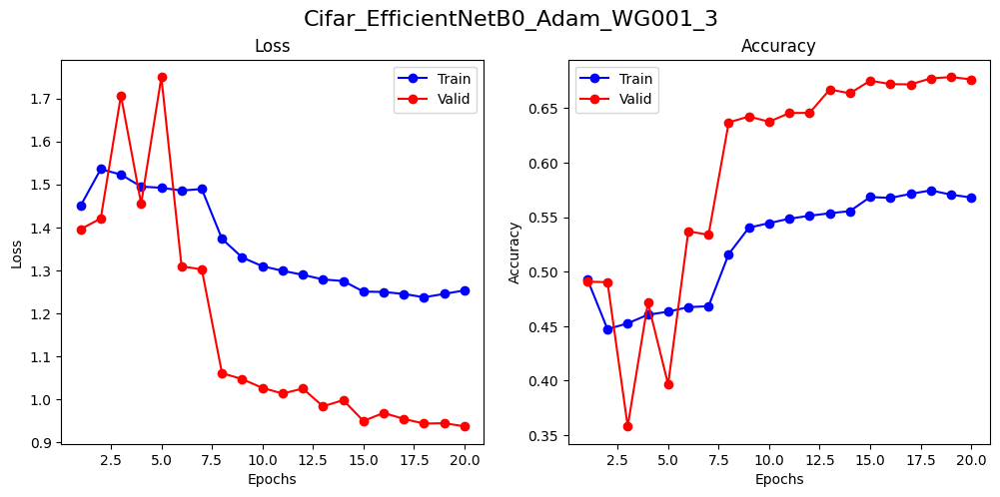

In [337]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [338]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.6813

Classification Report:
              precision    recall  f1-score   support

    airplane       0.69      0.73      0.71      2000
  automobile       0.84      0.88      0.86      2000
        bird       0.52      0.51      0.51      2000
         cat       0.50      0.25      0.33      2000
        deer       0.69      0.55      0.62      2000
         dog       0.51      0.73      0.60      2000
        frog       0.68      0.79      0.73      2000
       horse       0.72      0.75      0.73      2000
        ship       0.81      0.82      0.82      2000
       truck       0.83      0.81      0.82      2000

    accuracy                           0.68     20000
   macro avg       0.68      0.68      0.67     20000
weighted avg       0.68      0.68      0.67     20000



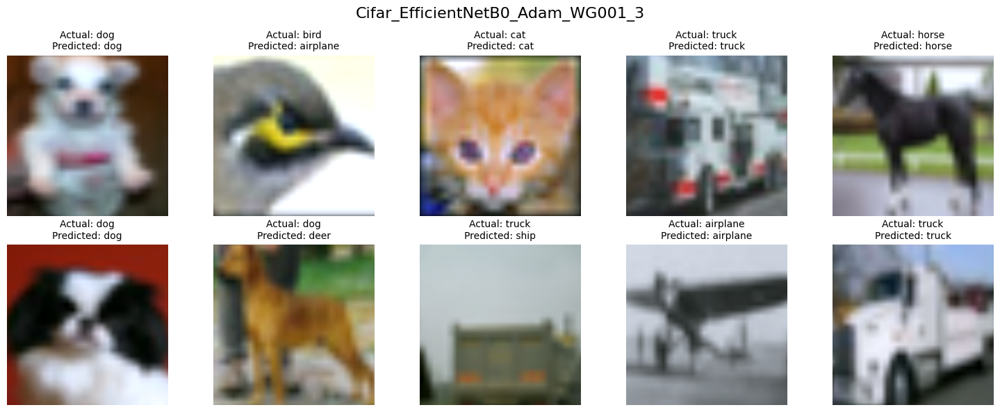

In [339]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

## Weight decay


### EfficientNetB0 SGD wd = 0.001


In [340]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [341]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [342]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.5226 Acc: 0.5101
valid Loss: 0.5853 Acc: 0.8203

Epoch 1/19
----------
train Loss: 0.9082 Acc: 0.6889
valid Loss: 0.3704 Acc: 0.8798

Epoch 2/19
----------
train Loss: 0.7566 Acc: 0.7410
valid Loss: 0.2816 Acc: 0.9066

Epoch 3/19
----------
train Loss: 0.6617 Acc: 0.7738
valid Loss: 0.2437 Acc: 0.9175

Epoch 4/19
----------
train Loss: 0.6252 Acc: 0.7862
valid Loss: 0.2044 Acc: 0.9315

Epoch 5/19
----------
train Loss: 0.5717 Acc: 0.8027
valid Loss: 0.1849 Acc: 0.9373

Epoch 6/19
----------
train Loss: 0.5518 Acc: 0.8119
valid Loss: 0.1860 Acc: 0.9375

Epoch 7/19
----------
train Loss: 0.5252 Acc: 0.8199
valid Loss: 0.1731 Acc: 0.9416

Epoch 8/19
----------
train Loss: 0.5171 Acc: 0.8239
valid Loss: 0.1709 Acc: 0.9430

Epoch 9/19
----------
train Loss: 0.5057 Acc: 0.8273
valid Loss: 0.1673 Acc: 0.9434

Epoch 10/19
----------
train Loss: 0.5153 Acc: 0.8236
valid Loss: 0.1650 Acc: 0.9440

Epoch 11/19
----------
train Loss: 0.5144 Acc: 0.8237
valid Loss

In [343]:
title = 'Cifar_EfficientNetB0_SGD_WD0001_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

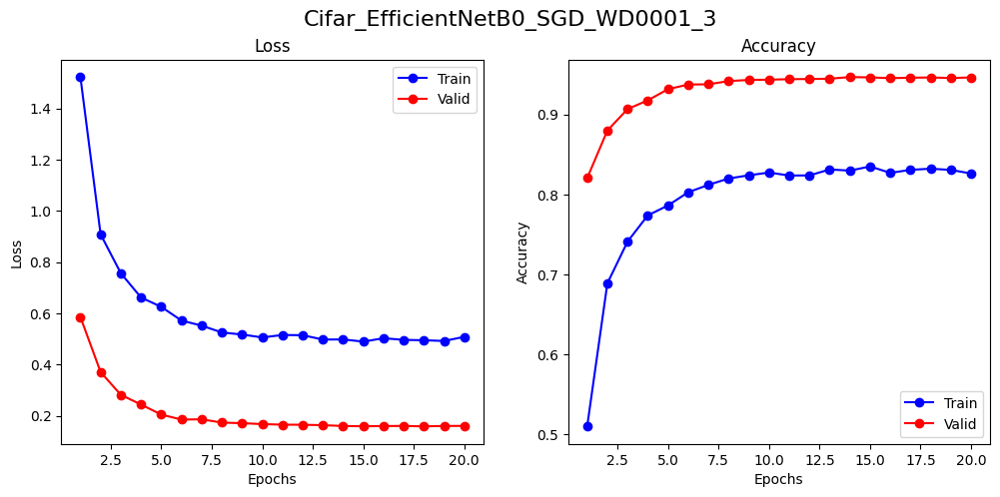

In [344]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [345]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9454

Classification Report:
              precision    recall  f1-score   support

    airplane       0.95      0.94      0.95      2000
  automobile       0.96      0.97      0.97      2000
        bird       0.95      0.93      0.94      2000
         cat       0.89      0.90      0.89      2000
        deer       0.94      0.95      0.94      2000
         dog       0.93      0.90      0.91      2000
        frog       0.96      0.97      0.97      2000
       horse       0.95      0.95      0.95      2000
        ship       0.96      0.98      0.97      2000
       truck       0.96      0.96      0.96      2000

    accuracy                           0.95     20000
   macro avg       0.95      0.95      0.95     20000
weighted avg       0.95      0.95      0.95     20000



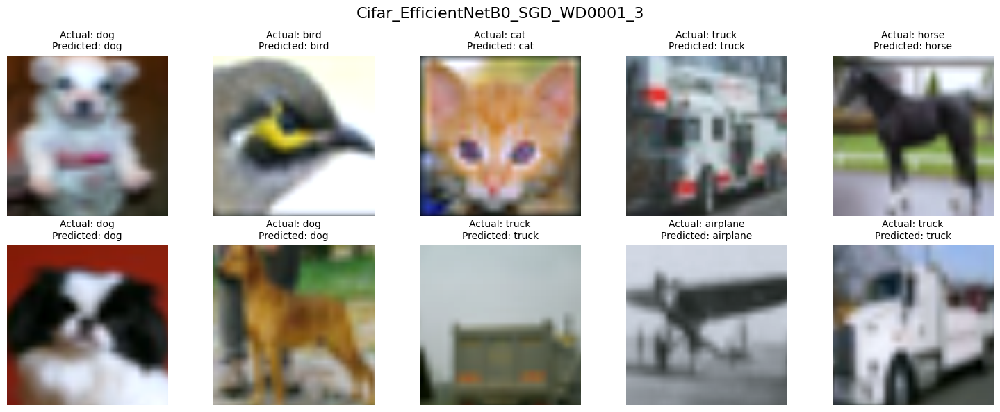

In [346]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD wd = 0.01


In [347]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [348]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [349]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.5146 Acc: 0.5117
valid Loss: 0.5687 Acc: 0.8239

Epoch 1/19
----------
train Loss: 0.8998 Acc: 0.6923
valid Loss: 0.3753 Acc: 0.8778

Epoch 2/19
----------
train Loss: 0.7613 Acc: 0.7410
valid Loss: 0.2859 Acc: 0.9063

Epoch 3/19
----------
train Loss: 0.6820 Acc: 0.7708
valid Loss: 0.2561 Acc: 0.9160

Epoch 4/19
----------
train Loss: 0.6542 Acc: 0.7763
valid Loss: 0.2405 Acc: 0.9221

Epoch 5/19
----------
train Loss: 0.6215 Acc: 0.7894
valid Loss: 0.2197 Acc: 0.9270

Epoch 6/19
----------
train Loss: 0.6071 Acc: 0.7936
valid Loss: 0.2283 Acc: 0.9230

Epoch 7/19
----------
train Loss: 0.5732 Acc: 0.8091
valid Loss: 0.2090 Acc: 0.9294

Epoch 8/19
----------
train Loss: 0.5641 Acc: 0.8117
valid Loss: 0.2040 Acc: 0.9325

Epoch 9/19
----------
train Loss: 0.5524 Acc: 0.8150
valid Loss: 0.1992 Acc: 0.9340

Epoch 10/19
----------
train Loss: 0.5545 Acc: 0.8128
valid Loss: 0.1977 Acc: 0.9347

Epoch 11/19
----------
train Loss: 0.5510 Acc: 0.8161
valid Loss

In [350]:
title = 'Cifar_EfficientNetB0_SGD_WD001_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

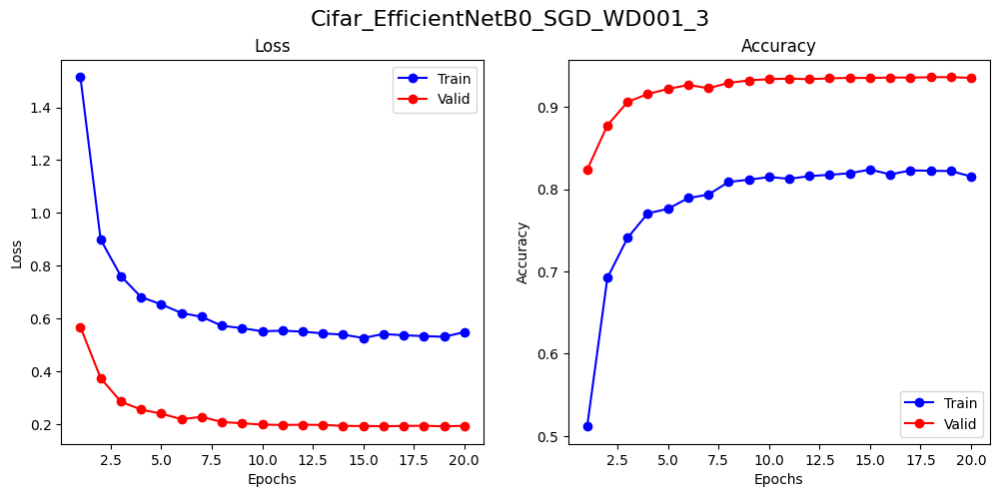

In [351]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [352]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9379

Classification Report:
              precision    recall  f1-score   support

    airplane       0.95      0.94      0.94      2000
  automobile       0.97      0.97      0.97      2000
        bird       0.96      0.91      0.93      2000
         cat       0.85      0.90      0.87      2000
        deer       0.93      0.94      0.94      2000
         dog       0.92      0.88      0.90      2000
        frog       0.95      0.97      0.96      2000
       horse       0.95      0.95      0.95      2000
        ship       0.96      0.97      0.96      2000
       truck       0.95      0.96      0.96      2000

    accuracy                           0.94     20000
   macro avg       0.94      0.94      0.94     20000
weighted avg       0.94      0.94      0.94     20000



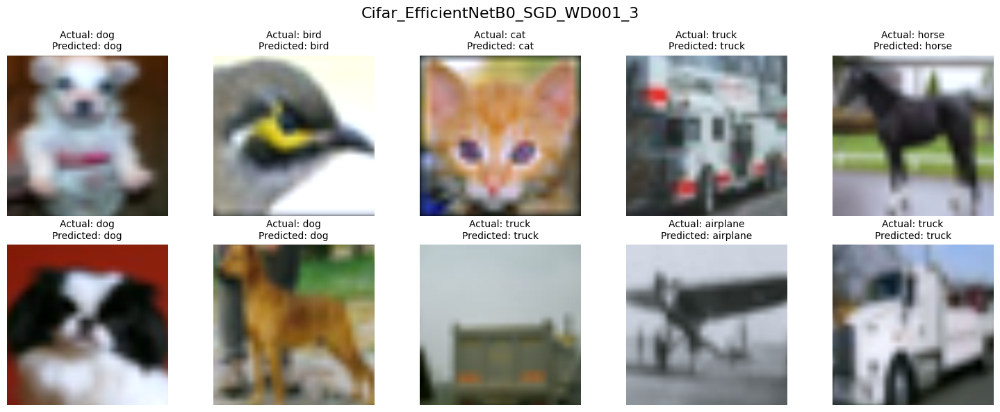

In [353]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD wd = 0.1


In [354]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [355]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=0.1)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [356]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.5793 Acc: 0.5029
valid Loss: 1.1170 Acc: 0.7130

Epoch 1/19
----------
train Loss: 1.1987 Acc: 0.6045
valid Loss: 1.0948 Acc: 0.6744

Epoch 2/19
----------
train Loss: 1.3526 Acc: 0.5437
valid Loss: 1.6010 Acc: 0.5367

Epoch 3/19
----------
train Loss: 1.6146 Acc: 0.4588
valid Loss: 1.8177 Acc: 0.4440

Epoch 4/19
----------
train Loss: 1.8499 Acc: 0.3801
valid Loss: 1.9567 Acc: 0.3132

Epoch 5/19
----------
train Loss: 2.0539 Acc: 0.2868
valid Loss: 2.1390 Acc: 0.2245

Epoch 6/19
----------
train Loss: 2.1686 Acc: 0.1982
valid Loss: 2.1607 Acc: 0.1900

Epoch 7/19
----------
train Loss: 2.1973 Acc: 0.1832
valid Loss: 2.1782 Acc: 0.1942

Epoch 8/19
----------
train Loss: 2.2004 Acc: 0.1837
valid Loss: 2.1893 Acc: 0.1866

Epoch 9/19
----------
train Loss: 2.2044 Acc: 0.1827
valid Loss: 2.1899 Acc: 0.1858

Epoch 10/19
----------
train Loss: 2.2081 Acc: 0.1822
valid Loss: 2.2004 Acc: 0.1797

Epoch 11/19
----------
train Loss: 2.2122 Acc: 0.1838
valid Loss

In [357]:
title = 'Cifar_EfficientNetB0_SGD_WD01_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

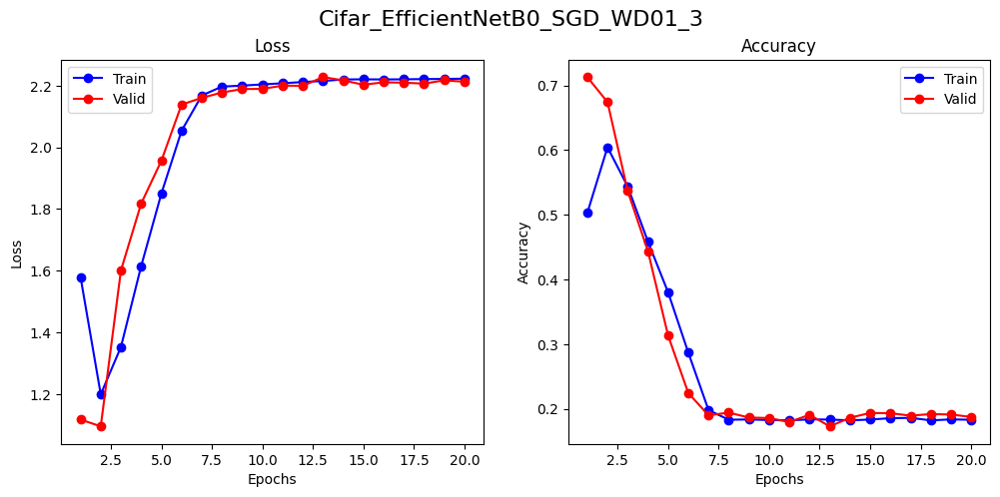

In [358]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [359]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.7104

Classification Report:
              precision    recall  f1-score   support

    airplane       0.70      0.79      0.74      2000
  automobile       0.96      0.72      0.83      2000
        bird       0.71      0.68      0.69      2000
         cat       0.45      0.70      0.55      2000
        deer       0.65      0.71      0.68      2000
         dog       0.89      0.37      0.53      2000
        frog       0.71      0.83      0.77      2000
       horse       0.89      0.54      0.68      2000
        ship       0.68      0.93      0.78      2000
       truck       0.87      0.83      0.85      2000

    accuracy                           0.71     20000
   macro avg       0.75      0.71      0.71     20000
weighted avg       0.75      0.71      0.71     20000



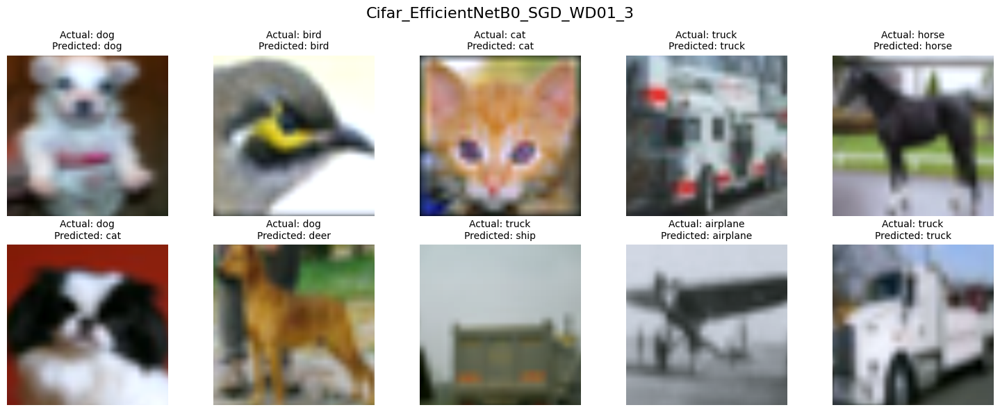

In [360]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

## Learning rate


### EfficientNetB0 SGD lr = 0.01


In [361]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [362]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [363]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.0213 Acc: 0.6455
valid Loss: 0.3819 Acc: 0.8740

Epoch 1/19
----------
train Loss: 0.7068 Acc: 0.7594
valid Loss: 0.2692 Acc: 0.9062

Epoch 2/19
----------
train Loss: 0.6077 Acc: 0.7873
valid Loss: 0.2421 Acc: 0.9144

Epoch 3/19
----------
train Loss: 0.5454 Acc: 0.8101
valid Loss: 0.2293 Acc: 0.9217

Epoch 4/19
----------
train Loss: 0.5180 Acc: 0.8188
valid Loss: 0.1904 Acc: 0.9350

Epoch 5/19
----------
train Loss: 0.4797 Acc: 0.8363
valid Loss: 0.1857 Acc: 0.9353

Epoch 6/19
----------
train Loss: 0.4653 Acc: 0.8404
valid Loss: 0.1825 Acc: 0.9381

Epoch 7/19
----------
train Loss: 0.3911 Acc: 0.8662
valid Loss: 0.1348 Acc: 0.9556

Epoch 8/19
----------
train Loss: 0.3657 Acc: 0.8739
valid Loss: 0.1294 Acc: 0.9564

Epoch 9/19
----------
train Loss: 0.3507 Acc: 0.8799
valid Loss: 0.1249 Acc: 0.9580

Epoch 10/19
----------
train Loss: 0.3445 Acc: 0.8789
valid Loss: 0.1224 Acc: 0.9589

Epoch 11/19
----------
train Loss: 0.3408 Acc: 0.8820
valid Loss

In [364]:
title = 'Cifar_EfficientNetB0_SGD_LR001_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

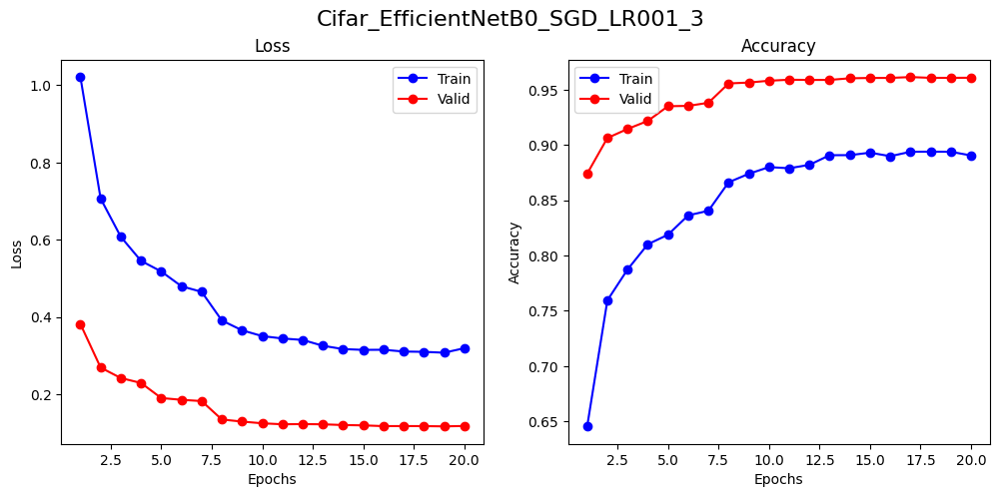

In [365]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [366]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9605

Classification Report:
              precision    recall  f1-score   support

    airplane       0.97      0.97      0.97      2000
  automobile       0.98      0.98      0.98      2000
        bird       0.96      0.95      0.96      2000
         cat       0.92      0.91      0.92      2000
        deer       0.96      0.97      0.96      2000
         dog       0.93      0.93      0.93      2000
        frog       0.97      0.98      0.97      2000
       horse       0.97      0.97      0.97      2000
        ship       0.97      0.98      0.98      2000
       truck       0.98      0.97      0.97      2000

    accuracy                           0.96     20000
   macro avg       0.96      0.96      0.96     20000
weighted avg       0.96      0.96      0.96     20000



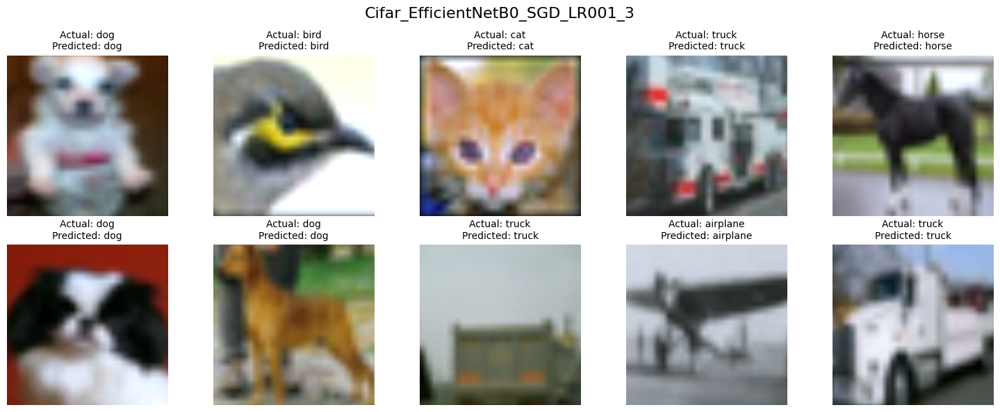

In [367]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD lr = 0.1


In [368]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [369]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [370]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.7630 Acc: 0.3684
valid Loss: 1.2069 Acc: 0.5889

Epoch 1/19
----------
train Loss: 1.2718 Acc: 0.5494
valid Loss: 0.8088 Acc: 0.7198

Epoch 2/19
----------
train Loss: 1.1005 Acc: 0.6155
valid Loss: 0.6561 Acc: 0.7737

Epoch 3/19
----------
train Loss: 0.9735 Acc: 0.6624
valid Loss: 0.6084 Acc: 0.7949

Epoch 4/19
----------
train Loss: 0.9123 Acc: 0.6806
valid Loss: 0.5339 Acc: 0.8180

Epoch 5/19
----------
train Loss: 0.8497 Acc: 0.7071
valid Loss: 0.4676 Acc: 0.8408

Epoch 6/19
----------
train Loss: 0.8025 Acc: 0.7235
valid Loss: 0.4863 Acc: 0.8313

Epoch 7/19
----------
train Loss: 0.6511 Acc: 0.7744
valid Loss: 0.3184 Acc: 0.8892

Epoch 8/19
----------
train Loss: 0.5928 Acc: 0.7955
valid Loss: 0.3057 Acc: 0.8945

Epoch 9/19
----------
train Loss: 0.5654 Acc: 0.8037
valid Loss: 0.2939 Acc: 0.8989

Epoch 10/19
----------
train Loss: 0.5391 Acc: 0.8130
valid Loss: 0.2891 Acc: 0.9001

Epoch 11/19
----------
train Loss: 0.5333 Acc: 0.8174
valid Loss

In [371]:
title = 'Cifar_EfficientNetB0_SGD_LR01_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

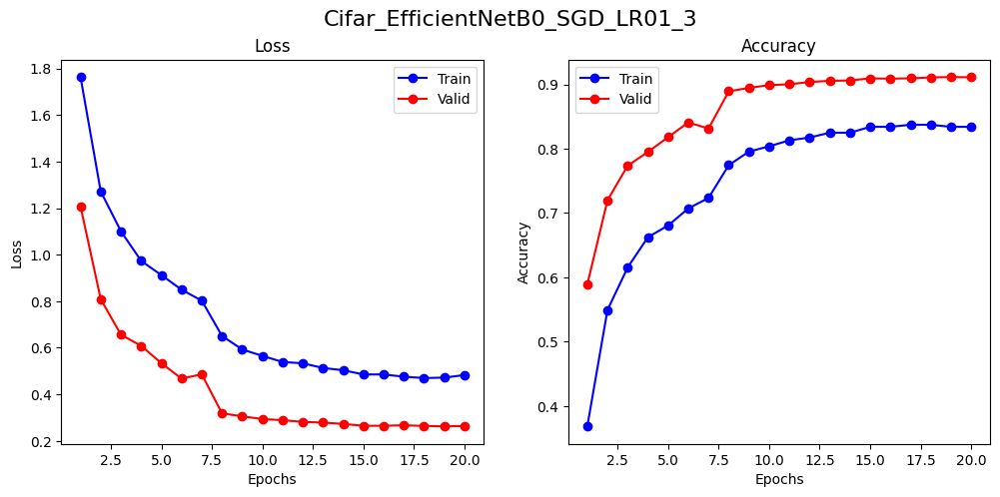

In [372]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [373]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9104

Classification Report:
              precision    recall  f1-score   support

    airplane       0.90      0.92      0.91      2000
  automobile       0.96      0.95      0.96      2000
        bird       0.90      0.88      0.89      2000
         cat       0.83      0.81      0.82      2000
        deer       0.91      0.92      0.92      2000
         dog       0.86      0.85      0.86      2000
        frog       0.91      0.95      0.93      2000
       horse       0.93      0.93      0.93      2000
        ship       0.95      0.94      0.95      2000
       truck       0.94      0.95      0.95      2000

    accuracy                           0.91     20000
   macro avg       0.91      0.91      0.91     20000
weighted avg       0.91      0.91      0.91     20000



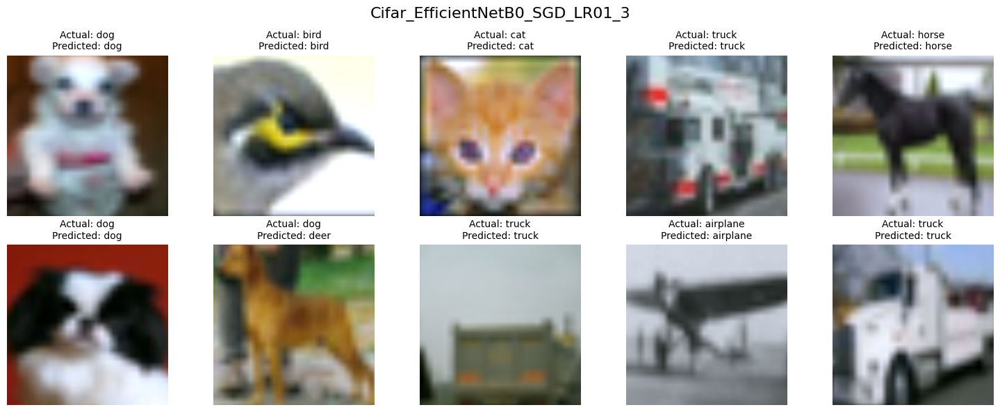

In [374]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

## Momentum


### EfficientNetB0 SGD momentum = 0


In [375]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [376]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [377]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 2.2059 Acc: 0.2279
valid Loss: 2.0325 Acc: 0.4551

Epoch 1/19
----------
train Loss: 1.9894 Acc: 0.4056
valid Loss: 1.7366 Acc: 0.6194

Epoch 2/19
----------
train Loss: 1.7660 Acc: 0.4916
valid Loss: 1.4085 Acc: 0.6865

Epoch 3/19
----------
train Loss: 1.5470 Acc: 0.5504
valid Loss: 1.1442 Acc: 0.7301

Epoch 4/19
----------
train Loss: 1.3793 Acc: 0.5736
valid Loss: 0.9376 Acc: 0.7615

Epoch 5/19
----------
train Loss: 1.2548 Acc: 0.6030
valid Loss: 0.7967 Acc: 0.7868

Epoch 6/19
----------
train Loss: 1.1601 Acc: 0.6250
valid Loss: 0.7138 Acc: 0.8007

Epoch 7/19
----------
train Loss: 1.1142 Acc: 0.6353
valid Loss: 0.6860 Acc: 0.8048

Epoch 8/19
----------
train Loss: 1.1004 Acc: 0.6416
valid Loss: 0.6840 Acc: 0.8057

Epoch 9/19
----------
train Loss: 1.0883 Acc: 0.6421
valid Loss: 0.6875 Acc: 0.8022

Epoch 10/19
----------
train Loss: 1.0903 Acc: 0.6393
valid Loss: 0.6676 Acc: 0.8089

Epoch 11/19
----------
train Loss: 1.0869 Acc: 0.6406
valid Loss

In [378]:
title = 'Cifar_EfficientNetB0_SGD_M0_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

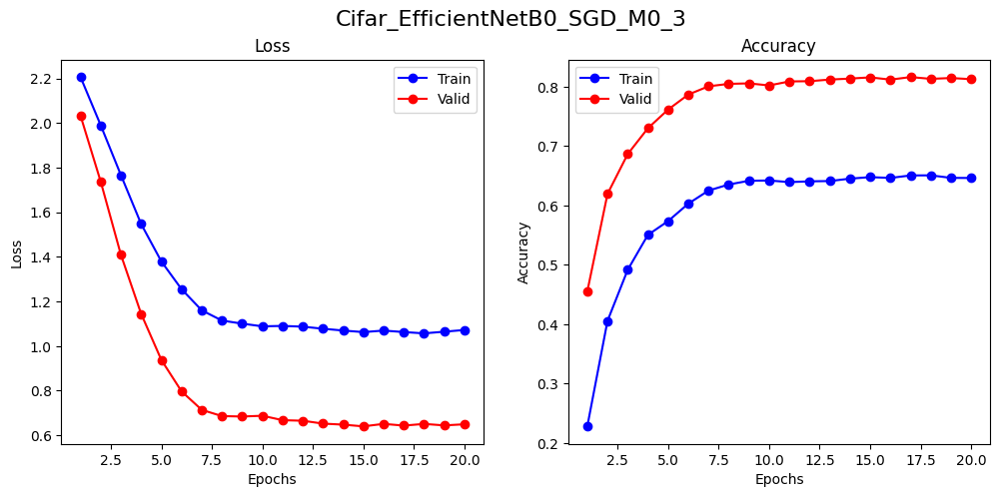

In [379]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [380]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.8156

Classification Report:
              precision    recall  f1-score   support

    airplane       0.79      0.87      0.83      2000
  automobile       0.93      0.92      0.93      2000
        bird       0.79      0.77      0.78      2000
         cat       0.69      0.63      0.66      2000
        deer       0.78      0.76      0.77      2000
         dog       0.72      0.78      0.75      2000
        frog       0.82      0.87      0.85      2000
       horse       0.83      0.81      0.82      2000
        ship       0.92      0.86      0.89      2000
       truck       0.91      0.89      0.90      2000

    accuracy                           0.82     20000
   macro avg       0.82      0.82      0.82     20000
weighted avg       0.82      0.82      0.82     20000



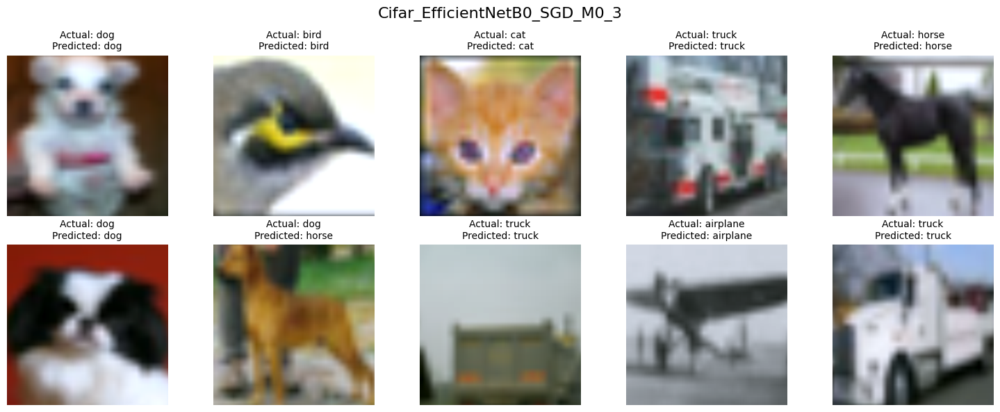

In [381]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD momentum = 0.5


In [382]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [383]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.5)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [384]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 2.1026 Acc: 0.3119
valid Loss: 1.7467 Acc: 0.6104

Epoch 1/19
----------
train Loss: 1.6687 Acc: 0.5162
valid Loss: 1.1547 Acc: 0.7297

Epoch 2/19
----------
train Loss: 1.3286 Acc: 0.5846
valid Loss: 0.8715 Acc: 0.7507

Epoch 3/19
----------
train Loss: 1.1353 Acc: 0.6281
valid Loss: 0.6616 Acc: 0.8109

Epoch 4/19
----------
train Loss: 1.0210 Acc: 0.6581
valid Loss: 0.5422 Acc: 0.8355

Epoch 5/19
----------
train Loss: 0.9440 Acc: 0.6791
valid Loss: 0.4627 Acc: 0.8566

Epoch 6/19
----------
train Loss: 0.8814 Acc: 0.7033
valid Loss: 0.4214 Acc: 0.8693

Epoch 7/19
----------
train Loss: 0.8476 Acc: 0.7124
valid Loss: 0.4101 Acc: 0.8713

Epoch 8/19
----------
train Loss: 0.8436 Acc: 0.7135
valid Loss: 0.4069 Acc: 0.8724

Epoch 9/19
----------
train Loss: 0.8307 Acc: 0.7137
valid Loss: 0.4094 Acc: 0.8690

Epoch 10/19
----------
train Loss: 0.8352 Acc: 0.7133
valid Loss: 0.3954 Acc: 0.8749

Epoch 11/19
----------
train Loss: 0.8368 Acc: 0.7130
valid Loss

In [385]:
title = 'Cifar_EfficientNetB0_SGD_M05_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

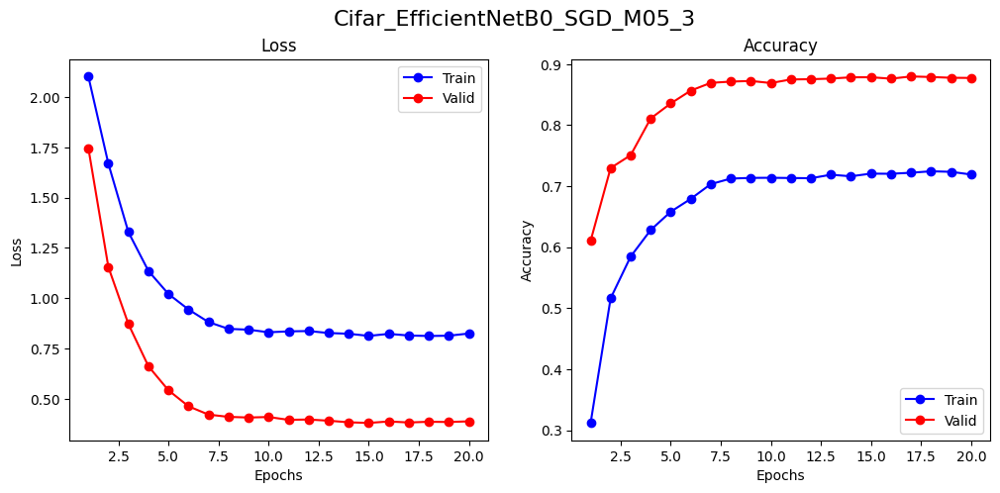

In [386]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [387]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.8811

Classification Report:
              precision    recall  f1-score   support

    airplane       0.87      0.91      0.89      2000
  automobile       0.95      0.95      0.95      2000
        bird       0.89      0.83      0.86      2000
         cat       0.78      0.78      0.78      2000
        deer       0.86      0.86      0.86      2000
         dog       0.81      0.84      0.82      2000
        frog       0.88      0.92      0.90      2000
       horse       0.91      0.86      0.88      2000
        ship       0.93      0.93      0.93      2000
       truck       0.94      0.94      0.94      2000

    accuracy                           0.88     20000
   macro avg       0.88      0.88      0.88     20000
weighted avg       0.88      0.88      0.88     20000



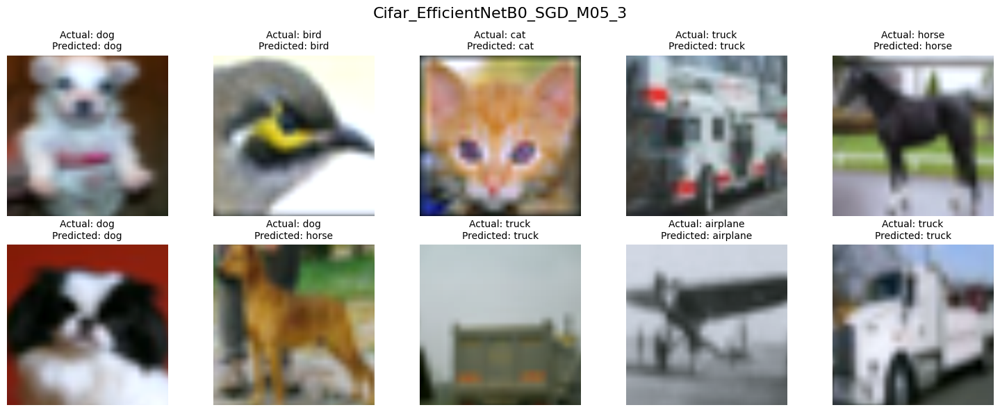

In [388]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD 10 epochs


In [389]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [390]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [391]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=10
)

Epoch 0/9
----------
train Loss: 1.5247 Acc: 0.5044
valid Loss: 0.5936 Acc: 0.8162

Epoch 1/9
----------
train Loss: 0.9110 Acc: 0.6863
valid Loss: 0.3879 Acc: 0.8715

Epoch 2/9
----------
train Loss: 0.7600 Acc: 0.7370
valid Loss: 0.2815 Acc: 0.9058

Epoch 3/9
----------
train Loss: 0.6665 Acc: 0.7682
valid Loss: 0.2457 Acc: 0.9170

Epoch 4/9
----------
train Loss: 0.6333 Acc: 0.7810
valid Loss: 0.2170 Acc: 0.9274

Epoch 5/9
----------
train Loss: 0.5795 Acc: 0.7999
valid Loss: 0.1888 Acc: 0.9370

Epoch 6/9
----------
train Loss: 0.5586 Acc: 0.8091
valid Loss: 0.1860 Acc: 0.9369

Epoch 7/9
----------
train Loss: 0.5304 Acc: 0.8173
valid Loss: 0.1752 Acc: 0.9417

Epoch 8/9
----------
train Loss: 0.5190 Acc: 0.8204
valid Loss: 0.1740 Acc: 0.9415

Epoch 9/9
----------
train Loss: 0.5104 Acc: 0.8244
valid Loss: 0.1710 Acc: 0.9421

Training complete in 18m 35s
Best val Acc: 0.942100


In [392]:
title = 'Cifar_EfficientNetB0_SGD_EPOCHS10_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

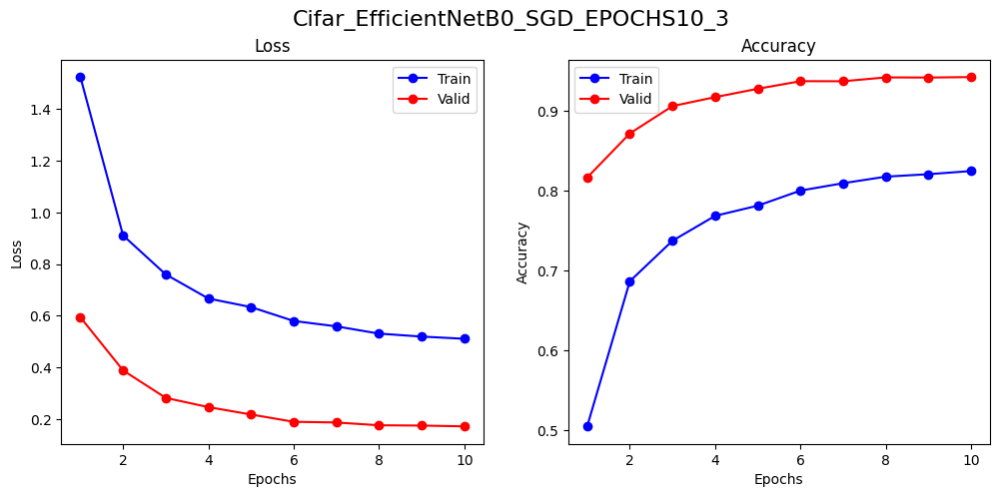

In [393]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [394]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9413

Classification Report:
              precision    recall  f1-score   support

    airplane       0.93      0.96      0.94      2000
  automobile       0.97      0.97      0.97      2000
        bird       0.93      0.93      0.93      2000
         cat       0.90      0.86      0.88      2000
        deer       0.94      0.94      0.94      2000
         dog       0.89      0.93      0.91      2000
        frog       0.97      0.95      0.96      2000
       horse       0.95      0.96      0.96      2000
        ship       0.97      0.96      0.97      2000
       truck       0.97      0.96      0.96      2000

    accuracy                           0.94     20000
   macro avg       0.94      0.94      0.94     20000
weighted avg       0.94      0.94      0.94     20000



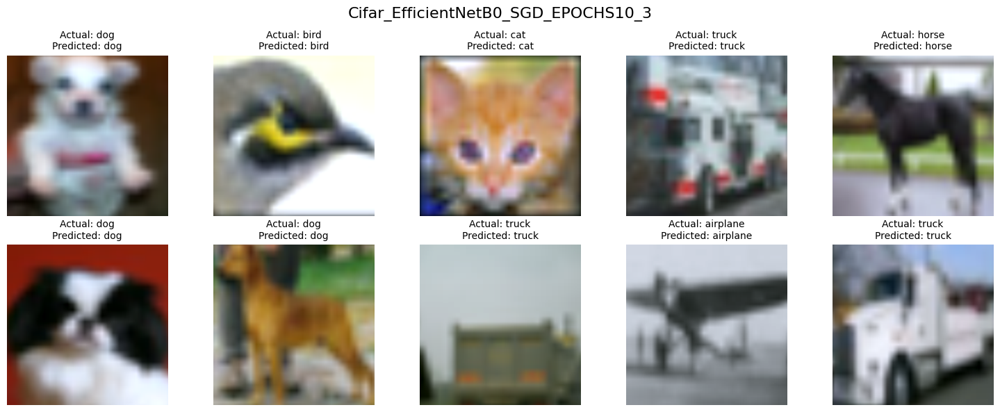

In [395]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD 40 epochs


In [396]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [397]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [398]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=40
)

Epoch 0/39
----------
train Loss: 1.5247 Acc: 0.5044
valid Loss: 0.5936 Acc: 0.8162

Epoch 1/39
----------
train Loss: 0.9110 Acc: 0.6863
valid Loss: 0.3879 Acc: 0.8715

Epoch 2/39
----------
train Loss: 0.7600 Acc: 0.7370
valid Loss: 0.2815 Acc: 0.9058

Epoch 3/39
----------
train Loss: 0.6665 Acc: 0.7682
valid Loss: 0.2457 Acc: 0.9170

Epoch 4/39
----------
train Loss: 0.6333 Acc: 0.7810
valid Loss: 0.2170 Acc: 0.9274

Epoch 5/39
----------
train Loss: 0.5795 Acc: 0.7999
valid Loss: 0.1888 Acc: 0.9370

Epoch 6/39
----------
train Loss: 0.5586 Acc: 0.8091
valid Loss: 0.1860 Acc: 0.9369

Epoch 7/39
----------
train Loss: 0.5304 Acc: 0.8173
valid Loss: 0.1752 Acc: 0.9417

Epoch 8/39
----------
train Loss: 0.5190 Acc: 0.8204
valid Loss: 0.1740 Acc: 0.9415

Epoch 9/39
----------
train Loss: 0.5104 Acc: 0.8244
valid Loss: 0.1710 Acc: 0.9421

Epoch 10/39
----------
train Loss: 0.5185 Acc: 0.8226
valid Loss: 0.1679 Acc: 0.9434

Epoch 11/39
----------
train Loss: 0.5183 Acc: 0.8215
valid Loss

In [399]:
title = 'Cifar_EfficientNetB0_SGD_EPOCHS40_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

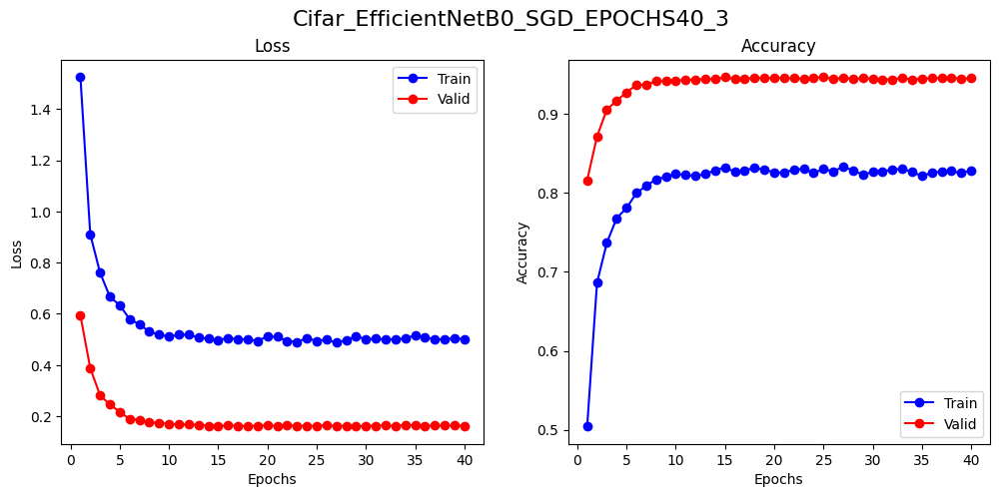

In [400]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [401]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.9438

Classification Report:
              precision    recall  f1-score   support

    airplane       0.94      0.95      0.94      2000
  automobile       0.97      0.97      0.97      2000
        bird       0.95      0.93      0.94      2000
         cat       0.90      0.87      0.89      2000
        deer       0.94      0.95      0.94      2000
         dog       0.90      0.92      0.91      2000
        frog       0.96      0.96      0.96      2000
       horse       0.94      0.96      0.95      2000
        ship       0.97      0.96      0.97      2000
       truck       0.95      0.97      0.96      2000

    accuracy                           0.94     20000
   macro avg       0.94      0.94      0.94     20000
weighted avg       0.94      0.94      0.94     20000



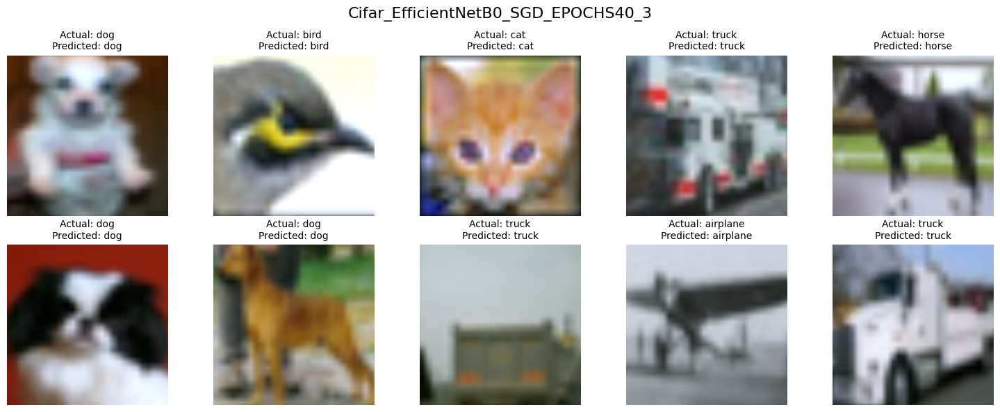

In [402]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

## Augmentation


In [403]:
from torchvision import transforms

In [404]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

### EfficientNetB0 SGD Augmentation = None


In [405]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [406]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

data = Data(data_dir, train_transform = transform, test_transform=transform, valid_transform=transform)

In [407]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [408]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 0.6333 Acc: 0.7903
valid Loss: 0.9185 Acc: 0.6853

Epoch 1/19
----------
train Loss: 0.6760 Acc: 0.7687
valid Loss: 1.0992 Acc: 0.6220

Epoch 2/19
----------
train Loss: 0.9501 Acc: 0.6771
valid Loss: 1.5852 Acc: 0.4351

Epoch 3/19
----------
train Loss: 1.1402 Acc: 0.6102
valid Loss: 1.4921 Acc: 0.4730

Epoch 4/19
----------
train Loss: 1.2300 Acc: 0.5768
valid Loss: 1.3721 Acc: 0.5563

Epoch 5/19
----------
train Loss: 1.2873 Acc: 0.5639
valid Loss: 1.5161 Acc: 0.4352

Epoch 6/19
----------
train Loss: 1.3210 Acc: 0.5473
valid Loss: 2.1844 Acc: 0.5057

Epoch 7/19
----------
train Loss: 1.1000 Acc: 0.6433
valid Loss: 1.0040 Acc: 0.6855

Epoch 8/19
----------
train Loss: 1.0123 Acc: 0.6747
valid Loss: 0.9664 Acc: 0.7032

Epoch 9/19
----------
train Loss: 0.9796 Acc: 0.6811
valid Loss: 0.9772 Acc: 0.7011

Epoch 10/19
----------
train Loss: 0.9646 Acc: 0.6880
valid Loss: 0.9028 Acc: 0.7088

Epoch 11/19
----------
train Loss: 0.9538 Acc: 0.6893
valid Loss

In [409]:
title = 'Cifar_EfficientNetB0_SGD_AUG_NONE_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

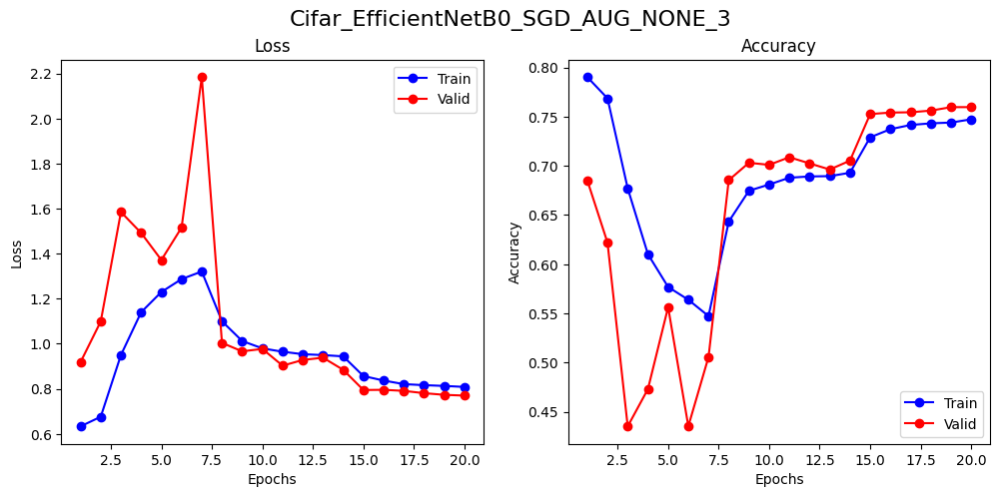

In [410]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [411]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.7579

Classification Report:
              precision    recall  f1-score   support

    airplane       0.80      0.72      0.76      2000
  automobile       0.89      0.91      0.90      2000
        bird       0.67      0.62      0.65      2000
         cat       0.60      0.55      0.58      2000
        deer       0.70      0.77      0.73      2000
         dog       0.69      0.64      0.67      2000
        frog       0.75      0.83      0.79      2000
       horse       0.79      0.78      0.78      2000
        ship       0.82      0.87      0.85      2000
       truck       0.84      0.89      0.86      2000

    accuracy                           0.76     20000
   macro avg       0.76      0.76      0.76     20000
weighted avg       0.76      0.76      0.76     20000



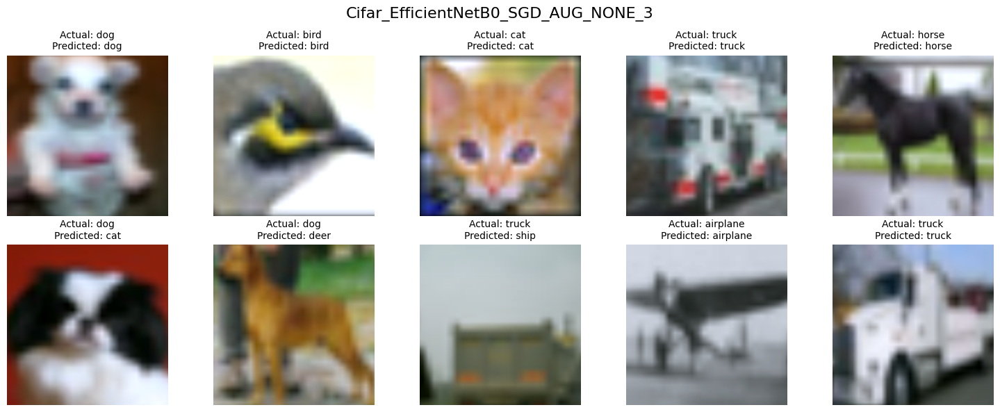

In [412]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD Augmentation = ColorJitter


In [413]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [414]:
train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ColorJitter(brightness=0.2, contrast=0.2), 
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

data = Data(data_dir, train_transform = train_transform, test_transform=transform, valid_transform=transform)

In [415]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [416]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 0.6480 Acc: 0.7845
valid Loss: 0.8154 Acc: 0.7224

Epoch 1/19
----------
train Loss: 0.6841 Acc: 0.7668
valid Loss: 1.0964 Acc: 0.6074

Epoch 2/19
----------
train Loss: 0.9595 Acc: 0.6735
valid Loss: 1.4143 Acc: 0.5212

Epoch 3/19
----------
train Loss: 1.1615 Acc: 0.6041
valid Loss: 1.5795 Acc: 0.4283

Epoch 4/19
----------
train Loss: 1.2438 Acc: 0.5784
valid Loss: 1.5375 Acc: 0.4512

Epoch 5/19
----------
train Loss: 1.3007 Acc: 0.5584
valid Loss: 1.4758 Acc: 0.4630

Epoch 6/19
----------
train Loss: 1.3318 Acc: 0.5445
valid Loss: 1.6632 Acc: 0.4345

Epoch 7/19
----------
train Loss: 1.0960 Acc: 0.6473
valid Loss: 0.9646 Acc: 0.6975

Epoch 8/19
----------
train Loss: 1.0115 Acc: 0.6745
valid Loss: 0.9444 Acc: 0.7077

Epoch 9/19
----------
train Loss: 0.9815 Acc: 0.6854
valid Loss: 0.9232 Acc: 0.7094

Epoch 10/19
----------
train Loss: 0.9655 Acc: 0.6875
valid Loss: 0.8876 Acc: 0.7146

Epoch 11/19
----------
train Loss: 0.9587 Acc: 0.6899
valid Loss

In [417]:
title = 'Cifar_EfficientNetB0_SGD_AUG_ColorJitter_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

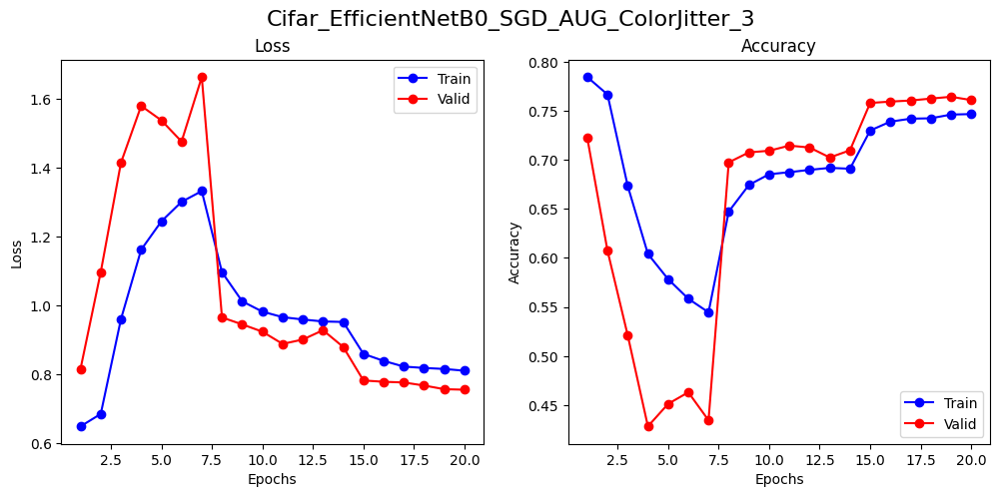

In [418]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [419]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.7642

Classification Report:
              precision    recall  f1-score   support

    airplane       0.78      0.76      0.77      2000
  automobile       0.92      0.90      0.91      2000
        bird       0.67      0.64      0.65      2000
         cat       0.57      0.62      0.59      2000
        deer       0.73      0.75      0.74      2000
         dog       0.72      0.63      0.67      2000
        frog       0.79      0.80      0.80      2000
       horse       0.81      0.79      0.80      2000
        ship       0.81      0.88      0.84      2000
       truck       0.85      0.88      0.86      2000

    accuracy                           0.76     20000
   macro avg       0.76      0.76      0.76     20000
weighted avg       0.76      0.76      0.76     20000



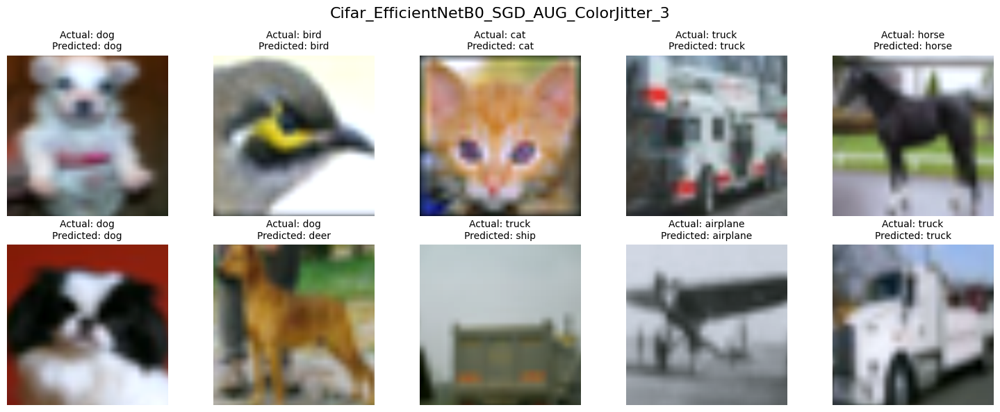

In [420]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD Augmentation = Gray Scale + GaussianBlur


In [421]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [422]:
train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.RandomGrayscale(p=0.1),
    transforms.GaussianBlur(kernel_size=3),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

data = Data(data_dir, train_transform = train_transform, test_transform=transform, valid_transform=transform)

In [423]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [424]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 0.6700 Acc: 0.7759
valid Loss: 0.8616 Acc: 0.7115

Epoch 1/19
----------
train Loss: 0.6905 Acc: 0.7657
valid Loss: 1.1249 Acc: 0.6104

Epoch 2/19
----------
train Loss: 0.9629 Acc: 0.6695
valid Loss: 1.6924 Acc: 0.3683

Epoch 3/19
----------
train Loss: 1.1547 Acc: 0.6008
valid Loss: 1.3902 Acc: 0.4950

Epoch 4/19
----------
train Loss: 1.2501 Acc: 0.5735
valid Loss: 1.4326 Acc: 0.5296

Epoch 5/19
----------
train Loss: 1.2959 Acc: 0.5578
valid Loss: 1.3927 Acc: 0.5117

Epoch 6/19
----------
train Loss: 1.3317 Acc: 0.5433
valid Loss: 1.5398 Acc: 0.4687

Epoch 7/19
----------
train Loss: 1.0900 Acc: 0.6492
valid Loss: 0.9574 Acc: 0.6955

Epoch 8/19
----------
train Loss: 1.0089 Acc: 0.6754
valid Loss: 0.9299 Acc: 0.7087

Epoch 9/19
----------
train Loss: 0.9769 Acc: 0.6866
valid Loss: 0.9377 Acc: 0.6990

Epoch 10/19
----------
train Loss: 0.9636 Acc: 0.6880
valid Loss: 0.8680 Acc: 0.7177

Epoch 11/19
----------
train Loss: 0.9548 Acc: 0.6909
valid Loss

In [425]:
title = 'Cifar_EfficientNetB0_SGD_AUG_Grayscale_Blur_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

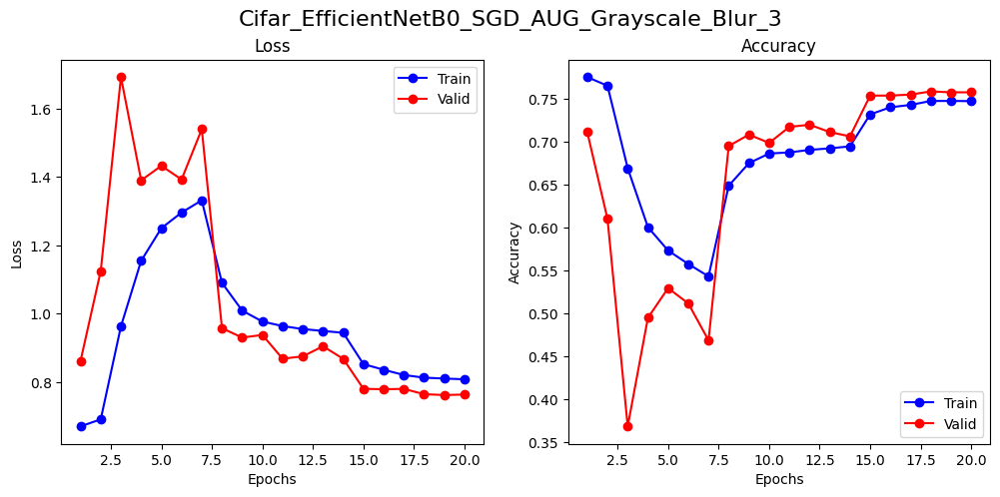

In [426]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [427]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.7637

Classification Report:
              precision    recall  f1-score   support

    airplane       0.75      0.79      0.77      2000
  automobile       0.92      0.90      0.91      2000
        bird       0.67      0.61      0.64      2000
         cat       0.63      0.55      0.59      2000
        deer       0.69      0.77      0.73      2000
         dog       0.72      0.65      0.68      2000
        frog       0.76      0.82      0.79      2000
       horse       0.76      0.82      0.79      2000
        ship       0.84      0.86      0.85      2000
       truck       0.87      0.86      0.87      2000

    accuracy                           0.76     20000
   macro avg       0.76      0.76      0.76     20000
weighted avg       0.76      0.76      0.76     20000



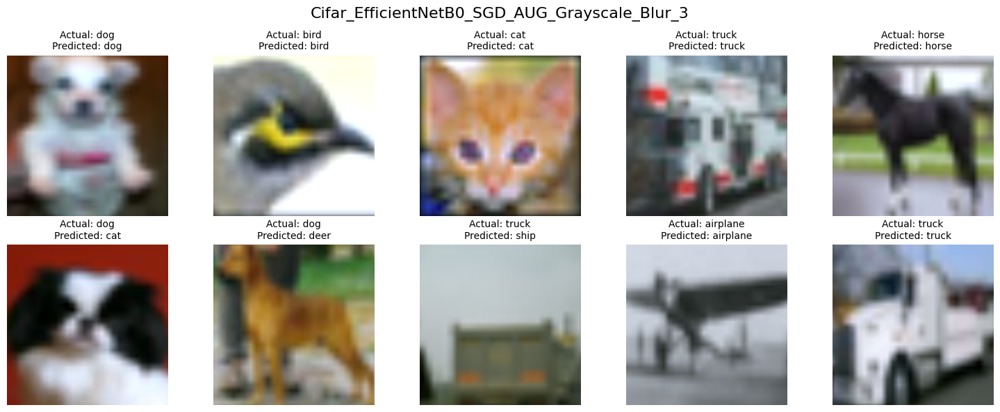

In [428]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### EfficientNetB0 SGD Augmentation = RandomHorizontalFlip + RandomCrop


In [429]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [430]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomResizedCrop(224), 
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

data = Data(data_dir, train_transform = train_transform, test_transform=transform, valid_transform=transform)

In [431]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [432]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 1.0996 Acc: 0.6190
valid Loss: 0.7540 Acc: 0.7492

Epoch 1/19
----------
train Loss: 1.1550 Acc: 0.5947
valid Loss: 1.4845 Acc: 0.4659

Epoch 2/19
----------
train Loss: 1.4122 Acc: 0.4941
valid Loss: 1.4898 Acc: 0.5056

Epoch 3/19
----------
train Loss: 1.6049 Acc: 0.4257
valid Loss: 1.6614 Acc: 0.4383

Epoch 4/19
----------
train Loss: 1.7151 Acc: 0.3845
valid Loss: 1.6097 Acc: 0.4196

Epoch 5/19
----------
train Loss: 1.7605 Acc: 0.3652
valid Loss: 1.7306 Acc: 0.3743

Epoch 6/19
----------
train Loss: 1.7852 Acc: 0.3463
valid Loss: 1.6361 Acc: 0.4630

Epoch 7/19
----------
train Loss: 1.6617 Acc: 0.4100
valid Loss: 1.3685 Acc: 0.5346

Epoch 8/19
----------
train Loss: 1.5969 Acc: 0.4349
valid Loss: 1.3609 Acc: 0.5316

Epoch 9/19
----------
train Loss: 1.5710 Acc: 0.4424
valid Loss: 1.3253 Acc: 0.5504

Epoch 10/19
----------
train Loss: 1.5653 Acc: 0.4400
valid Loss: 1.3059 Acc: 0.5558

Epoch 11/19
----------
train Loss: 1.5485 Acc: 0.4511
valid Loss

In [433]:
title = 'Cifar_EfficientNetB0_SGD_AUG_HorizontalFlip_Crop_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

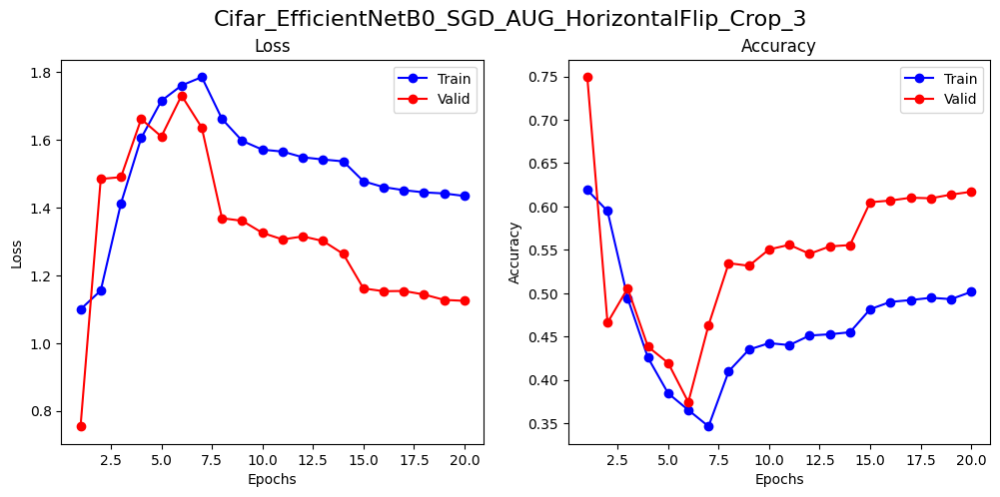

In [434]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [435]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.7559

Classification Report:
              precision    recall  f1-score   support

    airplane       0.83      0.75      0.79      2000
  automobile       0.93      0.84      0.88      2000
        bird       0.81      0.62      0.70      2000
         cat       0.59      0.70      0.64      2000
        deer       0.56      0.92      0.70      2000
         dog       0.90      0.49      0.63      2000
        frog       0.75      0.78      0.77      2000
       horse       0.82      0.74      0.78      2000
        ship       0.75      0.91      0.82      2000
       truck       0.91      0.82      0.86      2000

    accuracy                           0.76     20000
   macro avg       0.78      0.76      0.76     20000
weighted avg       0.78      0.76      0.76     20000



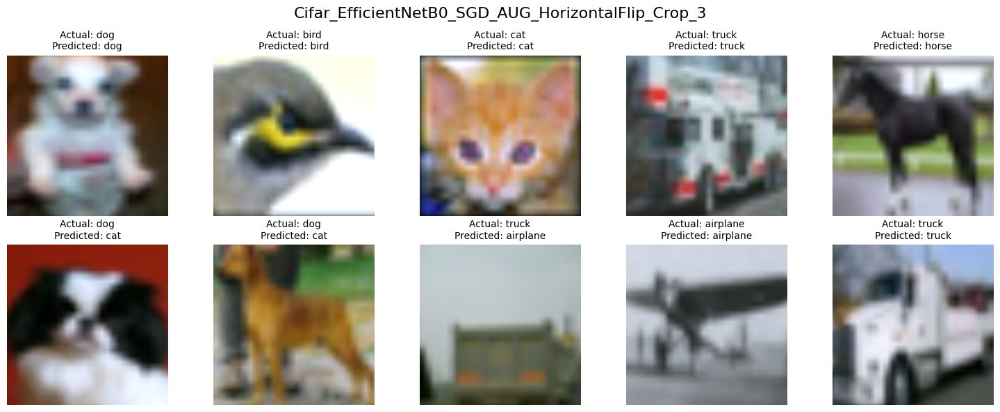

In [436]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### Advanced - EfficientNetB0 SGD Augmentation = Auto Augment


In [437]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [438]:
from torchvision.transforms import autoaugment

train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    autoaugment.AutoAugment(
        policy=autoaugment.AutoAugmentPolicy.CIFAR10,
        interpolation=transforms.InterpolationMode.BILINEAR,
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

data = Data(data_dir, train_transform = train_transform, test_transform=transform, valid_transform=transform)

In [439]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [440]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=20
)

Epoch 0/19
----------
train Loss: 0.8340 Acc: 0.7158
valid Loss: 2.3539 Acc: 0.0863

Epoch 1/19
----------
train Loss: 0.9024 Acc: 0.6904
valid Loss: 2.3350 Acc: 0.1000

Epoch 2/19
----------
train Loss: 1.2020 Acc: 0.5851
valid Loss: 2.2990 Acc: 0.1183

Epoch 3/19
----------
train Loss: 1.4140 Acc: 0.5066
valid Loss: 2.4393 Acc: 0.1144

Epoch 4/19
----------
train Loss: 1.5016 Acc: 0.4790
valid Loss: 2.3406 Acc: 0.1000

Epoch 5/19
----------
train Loss: 1.5701 Acc: 0.4458
valid Loss: 2.3421 Acc: 0.1000

Epoch 6/19
----------
train Loss: 1.6126 Acc: 0.4340
valid Loss: 2.3289 Acc: 0.0937

Epoch 7/19
----------
train Loss: 1.4098 Acc: 0.5204
valid Loss: 2.3276 Acc: 0.1000

Epoch 8/19
----------
train Loss: 1.3441 Acc: 0.5486
valid Loss: 2.3409 Acc: 0.1000

Epoch 9/19
----------
train Loss: 1.3033 Acc: 0.5575
valid Loss: 2.3326 Acc: 0.1000

Epoch 10/19
----------
train Loss: 1.2912 Acc: 0.5613
valid Loss: 2.3260 Acc: 0.1002

Epoch 11/19
----------
train Loss: 1.2785 Acc: 0.5650
valid Loss

In [441]:
title = 'Cifar_EfficientNetB0_SGD_AUG_AUTO_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

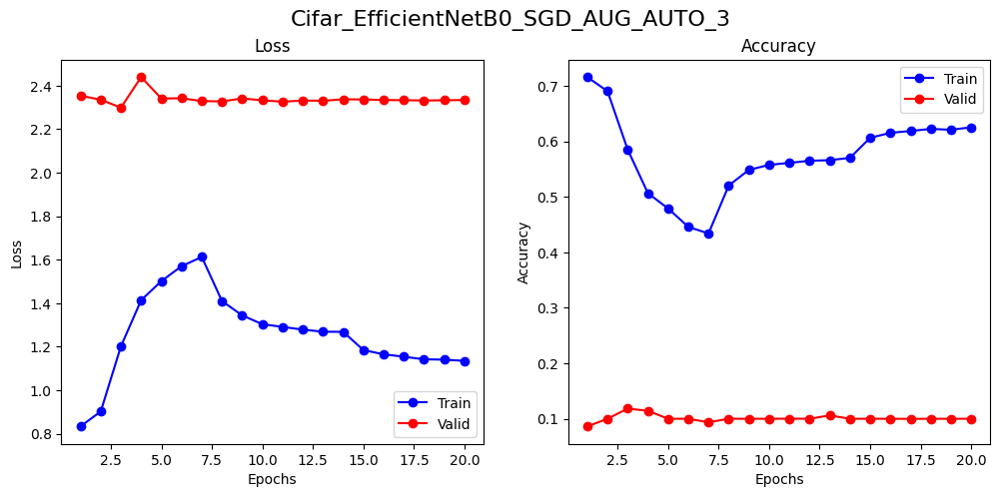

In [442]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [443]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.1213

Classification Report:
              precision    recall  f1-score   support

    airplane       0.41      0.13      0.20      2000
  automobile       0.00      0.00      0.00      2000
        bird       0.09      0.74      0.16      2000
         cat       0.29      0.00      0.00      2000
        deer       0.00      0.00      0.00      2000
         dog       0.30      0.02      0.03      2000
        frog       0.24      0.33      0.28      2000
       horse       0.00      0.00      0.00      2000
        ship       0.00      0.00      0.00      2000
       truck       0.00      0.00      0.00      2000

    accuracy                           0.12     20000
   macro avg       0.13      0.12      0.07     20000
weighted avg       0.13      0.12      0.07     20000



C:\Users\weron\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\weron\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\weron\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

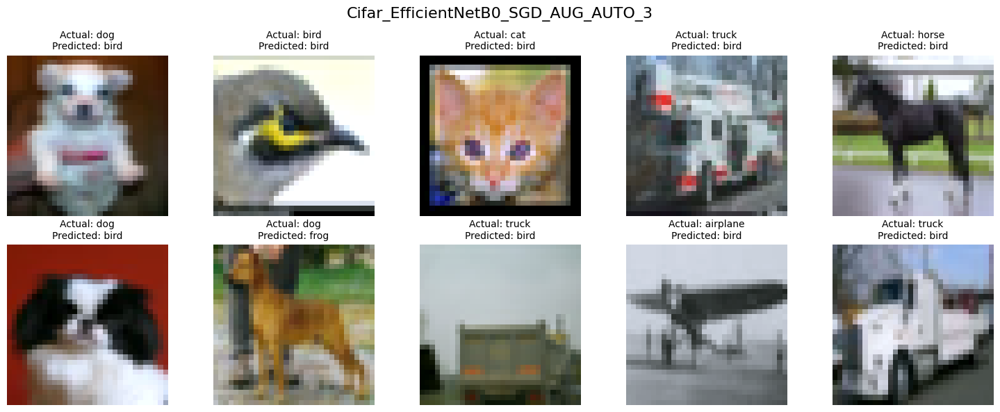

In [444]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)

### Advanced - EfficientNetB0 SGD Augmentation = Auto Augment 40 Epochs


In [445]:
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)

In [446]:
from torchvision.transforms import autoaugment

train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    autoaugment.AutoAugment(
        policy=autoaugment.AutoAugmentPolicy.CIFAR10,
        interpolation=transforms.InterpolationMode.BILINEAR,
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

data = Data(data_dir, train_transform = train_transform, test_transform=transform, valid_transform=transform)

In [447]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')
num_ftrs =  model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.2),
    nn.Linear(num_ftrs, len(data.class_names))
)
model = model.to(device)


criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.01)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [448]:
model, train_loss, train_acc, val_loss, val_acc = train_model(
    model, criterion, optimizer, exp_lr_scheduler, data.dataloaders, device, num_epochs=40
)

Epoch 0/39
----------
train Loss: 0.8340 Acc: 0.7158
valid Loss: 0.6699 Acc: 0.7835

Epoch 1/39
----------
train Loss: 0.9024 Acc: 0.6904
valid Loss: 1.5881 Acc: 0.4293

Epoch 2/39
----------
train Loss: 1.2020 Acc: 0.5851
valid Loss: 1.4105 Acc: 0.5345

Epoch 3/39
----------
train Loss: 1.4140 Acc: 0.5066
valid Loss: 1.5890 Acc: 0.4263

Epoch 4/39
----------
train Loss: 1.5016 Acc: 0.4790
valid Loss: 1.4988 Acc: 0.4780

Epoch 5/39
----------
train Loss: 1.5701 Acc: 0.4458
valid Loss: 1.6309 Acc: 0.4488

Epoch 6/39
----------
train Loss: 1.6126 Acc: 0.4340
valid Loss: 1.4406 Acc: 0.4983

Epoch 7/39
----------
train Loss: 1.4098 Acc: 0.5204
valid Loss: 1.1130 Acc: 0.6424

Epoch 8/39
----------
train Loss: 1.3441 Acc: 0.5486
valid Loss: 1.1285 Acc: 0.6365

Epoch 9/39
----------
train Loss: 1.3033 Acc: 0.5575
valid Loss: 1.0954 Acc: 0.6520

Epoch 10/39
----------
train Loss: 1.2912 Acc: 0.5613
valid Loss: 1.0435 Acc: 0.6618

Epoch 11/39
----------
train Loss: 1.2785 Acc: 0.5650
valid Loss

In [449]:
title = 'Cifar_EfficientNetB0_SGD_AUG_AUTO_EPOCHS40_3'
folder = os.path.join('experiments', title)
os.makedirs(folder, exist_ok=True)

torch.save(model.state_dict(), os.path.join(folder, 'best_model.pt'))

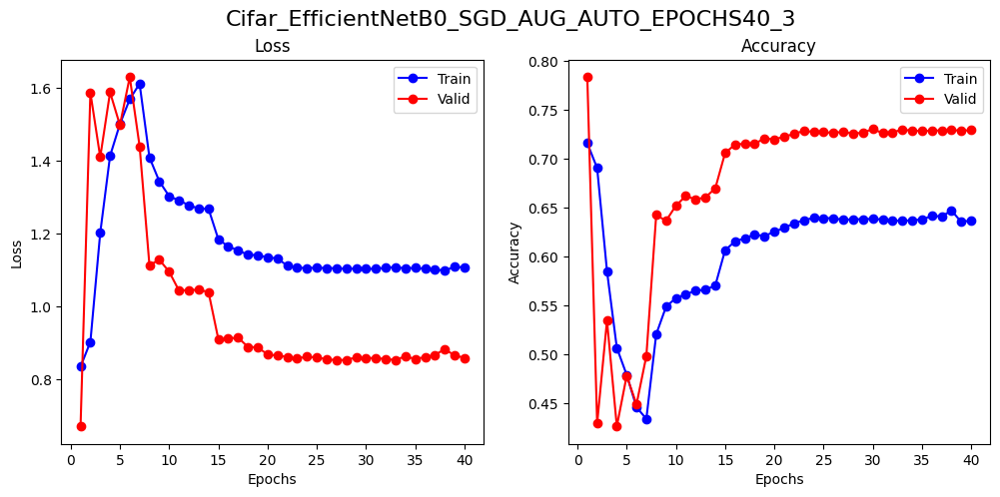

In [450]:
plot_training_history(train_loss, train_acc, val_loss, val_acc, title, folder)

In [451]:
test_model(model, data.dataloaders['test'], device, folder)

Accuracy: 0.7847

Classification Report:
              precision    recall  f1-score   support

    airplane       0.70      0.88      0.78      2000
  automobile       0.92      0.91      0.92      2000
        bird       0.79      0.70      0.74      2000
         cat       0.68      0.57      0.62      2000
        deer       0.74      0.76      0.75      2000
         dog       0.84      0.56      0.67      2000
        frog       0.65      0.93      0.76      2000
       horse       0.84      0.81      0.83      2000
        ship       0.88      0.85      0.86      2000
       truck       0.91      0.87      0.89      2000

    accuracy                           0.78     20000
   macro avg       0.80      0.78      0.78     20000
weighted avg       0.80      0.78      0.78     20000



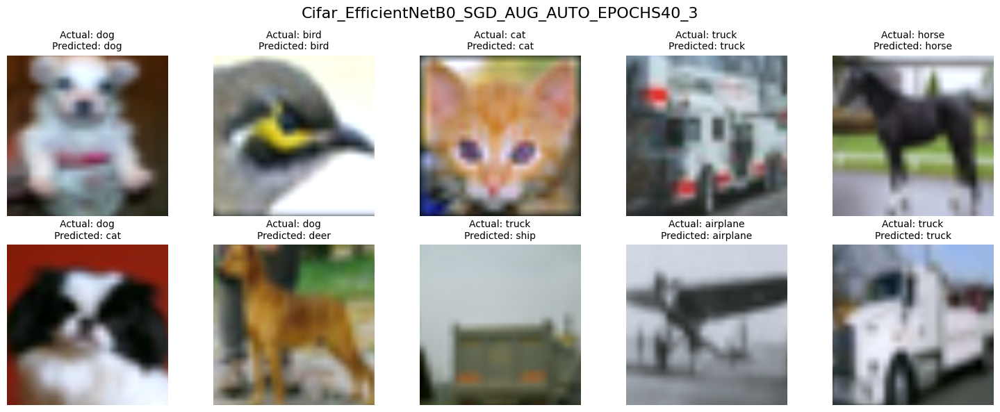

In [452]:
plot_examples(model, data.dataloaders['test'], device, data.class_names,folder, title)